# Data Mining Project "FAKE News Detection"

### Project Description

In order to accurately classified collection of news as real or fake we have to build a machine learning model.

To deals with the detection of fake or real news, we will develop the project in python with the help of ‘sklearn’, we will use ‘TfidfVectorizer’ in our news data which we will gather from online media.

After the first step is done, we will initialize the classifier, transform and fit the model. In the end, we will calculate the performance of the model using the appropriate performance matrix/matrices. Once will calculate the performance matrices we will be able to see how well our model performs.

Dataset used - https://www.kaggle.com/c/fake-news/data/train.csv

Dataset Description
train.csv: A full training dataset with the following attributes :-

 1. id: unique id for a news article
 2. title: the title of a news article
 3. author: author of the news article
 4. text: the text of the article; could be incomplete
 
    label: a label that marks the article as potentially unreliable
    1: FAKE
    0: REAL

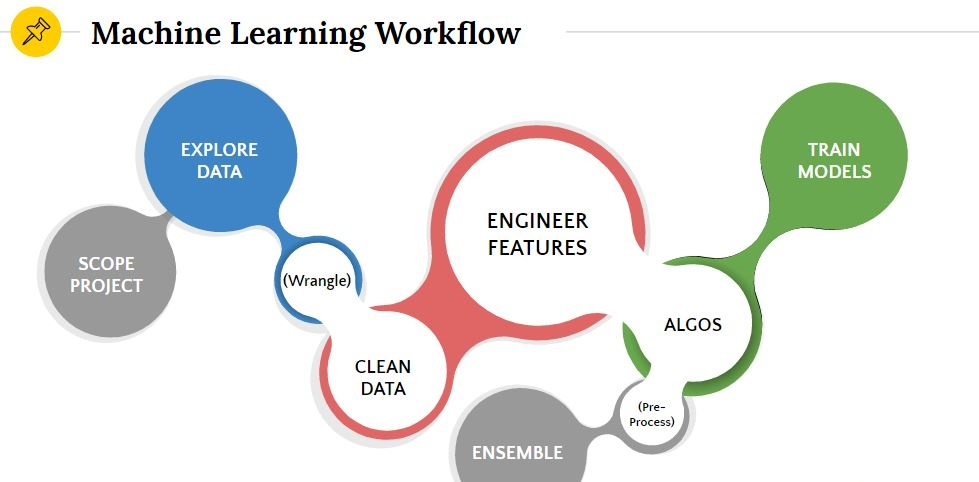

In [314]:
from IPython.display import Image
Image(filename="myproject.jpg")

These are the libraries which are to be loaded for correct running of the program . Anaconda integrated with NLTK is necessary . Otherwise it would end up giving errors

In [315]:
#Importing Libraries to be used 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

import re #Regular expressions 
import nltk #Natural Language Toolkit
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn import metrics
import itertools

### 1. DATA Loading & Analysis

In this step , data is being loaded from a csv file and being analyzed for the preprocessing step .

In [316]:
#Data Set loaded as Pandas Dataset
data = pd.read_csv("dataset.csv",nrows=3000)
data.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [317]:
data['text corpus'] = data['title']+' '+data['author']+' '+data['text']
data = data[["id", "title","author","text","text corpus", "label"]]
data.head()

,id,title,author,text,text corpus,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",Why the Truth Might Get You Fired Consortiumne...,1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,15 Civilians Killed In Single US Airstrike Hav...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,Iranian woman jailed for fictional unpublished...,1


In [391]:
# Data and Output Analysis
print(data['label'].value_counts())
data.shape
graph_sc = {'id': [1,2,3,4,5,6,7,8,9,10],
        'label': [0,1,1,1,1,1,0,0,1,0]
       }
  

0    1476
1    1143
Name: label, dtype: int64


### 2. DATA PreProcessing Step 

In [319]:
data.isnull().sum()

id               0
title           84
author         297
text             7
text corpus    381
label            0
dtype: int64

In [320]:
data = data[data['text corpus'].notna()]

data.isnull().sum()

id             0
title          0
author         0
text           0
text corpus    0
label          0
dtype: int64

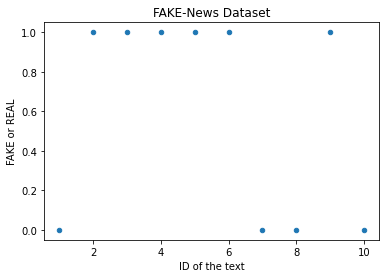

In [398]:
df = pd.DataFrame(graph_sc,columns=['id','label'])
df.plot(x ='id', y='label',kind = 'scatter')
plt.xlabel('ID of the text')
plt.ylabel('FAKE or REAL')
plt.title('FAKE-News Dataset')
plt.show()

In [325]:
def make_inorder(ser, match_name, default=None, regex=False, case=False):
    """ Search a series for text matches.
    Based on code from https://www.metasnake.com/blog/pydata-assign.html
    """
    seen = None
    for match, name in match_name:
        mask = ser.str.contains(match, case=case, regex=regex)
        if seen is None:
            seen = mask
        else:
            seen |= mask
        ser = ser.where(~mask, name)
    if default:
        ser = ser.where(seen, default)
    else:
        ser = ser.where(seen, ser.values)
    return ser

In [18]:
port_stem = PorterStemmer()

def data_cleaner(text_values):
    Ntext_values = re.sub('[^a-zA-Z]',' ',text_values) 
    Ntext_values = Ntext_values.lower()
    Ntext_values = Ntext_values.split()
    Ntext_values = [port_stem.stem(word) for word in Ntext_values if not word in stopwords.words('english')]
    Ntext_values = ' '.join(Ntext_values)
    return Ntext_values

In [ ]:
data['text corpus'] = data['text_corpus'].apply(cleaner)

In [322]:
X = data['text corpus'].values
X

array(['House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It Darrell Lucus House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) \nWith apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. \nAs we now know, Comey notified the Republican chairmen and Democratic ranking me

In [323]:
Y = data['label'].values
Y

array([1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,

In [324]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X)

X = vectorizer.transform(X)
print(X)

  (0, 59567)	0.008216155133107687
  (0, 59456)	0.03870390179143713
  (0, 59441)	0.009763408830894533
  (0, 59433)	0.010277418412558232
  (0, 59051)	0.03945232925314792
  (0, 59049)	0.08098176566166729
  (0, 59015)	0.03221101909787968
  (0, 58986)	0.01196673979784142
  (0, 58782)	0.024083257033192158
  (0, 58714)	0.02302225954512601
  (0, 58600)	0.007852277070309662
  (0, 58459)	0.03478322975042339
  (0, 58367)	0.0077084441478094436
  (0, 58351)	0.02399044650573932
  (0, 58320)	0.023329778565103248
  (0, 58247)	0.015020963200977644
  (0, 58208)	0.010955828283218142
  (0, 58162)	0.02478717710228979
  (0, 58121)	0.012003597501743585
  (0, 58036)	0.0614874083366581
  (0, 58012)	0.010543777429595268
  (0, 57914)	0.05231273492891709
  (0, 57587)	0.025150211324731685
  (0, 57578)	0.018658617191727005
  (0, 57569)	0.015020963200977644
  :	:
  (2618, 4185)	0.0987070201854951
  (2618, 3940)	0.06005719531100666
  (2618, 3830)	0.04975593019166853
  (2618, 3667)	0.018252951020497694
  (2618, 3433)	

In [328]:
data = data[["id","text corpus", "label"]]
data.head(10)

,id,text corpus,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",0
2,2,Why the Truth Might Get You Fired Consortiumne...,1
3,3,15 Civilians Killed In Single US Airstrike Hav...,1
4,4,Iranian woman jailed for fictional unpublished...,1
5,5,Jackie Mason: Hollywood Would Love Trump if He...,0
7,7,Benoît Hamon Wins French Socialist Party’s Pre...,0
9,9,"A Back-Channel Plan for Ukraine and Russia, Co...",0
10,10,Obama’s Organizing for Action Partners with So...,0
11,11,"BBC Comedy Sketch ""Real Housewives of ISIS"" Ca...",0


### 3. Splitting :- TRAIN & TEST Data

In [335]:
def train_test_split(data_train,data_test,folder_train,foler_test) :
    
    os.mkdir(folder_train)
    train_ind=list(data_train.index)
    
    # Train folder
    for i in tqdm(range(len(train_ind))):
        os.system('cp '+data_train[train_ind[i]]+' ./'+ folder_train + '/'  +data_train[train_ind[i]].split('/')[2])
   
    # Test folder
    for j in tqdm(range(len(test_ind))):
        os.system('cp '+data_test[test_ind[j]]+' ./'+ folder_test + '/'  +data_test[test_ind[j]].split('/')[2])

In [282]:
#Splitting DataSet in Train && Test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.18, stratify=Y, random_state=124)

### 4. Machine Learning Model :- LOGISTIC Regression

In [326]:
def sigmoid(x):
    # Activation function used to map any real value between 0 and 1
    return 1 / (1 + np.exp(-x))

def net_input(theta, x):
    # Computes the weighted sum of inputs
    return np.dot(x, theta)

def probability(theta, x):
    # Returns the probability after passing through sigmoid
    return sigmoid(net_input(theta, x))

In [327]:
def cost_function(self, theta, x, y):
    # Computes the cost function for all the training samples
    m = x.shape[0]
    total_cost = -(1 / m) * np.sum(
        y * np.log(probability(theta, x)) + (1 - y) * np.log(
            1 - probability(theta, x)))
    return total_cost

def gradient(self, theta, x, y):
    # Computes the gradient of the cost function at the point theta
    m = x.shape[0]
    return (1 / m) * np.dot(x.T, sigmoid(net_input(theta,   x)) - y)

In [283]:
model1 = LogisticRegression()

model1.fit(X_train, Y_train)

LogisticRegression()

In [284]:
# Accuracy Score on Training Data
X_train_prediction = model1.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)
np.set_printoptions(threshold=np.inf)
print(X_train_prediction)

[1 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1
 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 1 1 1
 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 1 1 0 1 1 0 0 1 0 0 0 1 1
 0 1 1 0 1 1 1 0 0 0 1 1 1 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 0
 1 0 0 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 1 0 1 0 1 1 1 1 1 0 0 0 1 1 0 0 1 1
 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1
 1 1 0 0 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1 1 0 0 0
 0 1 1 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 0 1 1
 1 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0
 0 1 0 1 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 1 0 0 0 1 1 1
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 1 1
 0 0 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0
 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1
 0 1 0 0 0 0 0 1 1 0 1 1 

In [285]:
# Accuracy Score on Test Data
X_test_prediction = model1.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)
X_test_prediction

array([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0,

In [286]:
print('Accuracy score on the training data: ',training_data_accuracy)
print('Accuracy score on the test data: ',test_data_accuracy)

Accuracy score on the training data:  0.9748486259897532
Accuracy score on the test data:  0.9279661016949152


### 4. Model Evaluation :- CONFUSION Matrix

In [333]:
def classification_accuracy(classification_scores, true_labels):
    """ Returns the fractional classification accuracy for a batch of N predictions """
    pred_labels = []  # Will store the N predicted class-IDs
    for row in classification_scores:
        pred_labels.append(np.argmax(row))

    num_correct = 0
    for i in range(len(pred_labels)):
        if pred_labels[i] == true_labels[i]:
            num_correct += 1
    return num_correct / len(true_labels)

In [287]:
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion Matrix',cmap=plt.cm.Blues):
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=45)
  plt.yticks(tick_marks, classes)

  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")
  plt.tight_layout()

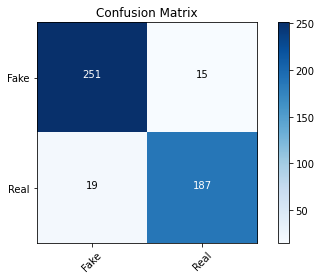

In [336]:
cm = metrics.confusion_matrix(Y_test, X_test_prediction)
plot_confusion_matrix(cm, classes=['Fake', 'Real'])

### 5. Prediction using Trained MODEL 

In [331]:
X_new = X_test[100]

prediction = model1.predict(X_new)

if (prediction[0] == 0):
  print('The news is Real')
else:
  print('The news is Fake & Unreliable')

The news is Real


# THE END